# Notebook for figuring out why BARRA-R eval is so different to the historical runs for certain time periods and indices

In [1]:
# IMPORTS:

import os, sys
sys.path.insert(0, os.path.dirname(os.getcwd())) 
import glob
import importlib
import pickle

import xarray as xr
import numpy as np
from xarray.groupers import SeasonResampler, SeasonGrouper
import os

from IPython.display import display
from matplotlib import colors, cm
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import cartopy.crs as ccrs
import cartopy.feature as cfeature

import turbulence_AUSCAT.auscat_plots as auscat_plots
from turbulence_AUSCAT.cat_evaluation import combined_significance_table, time_sel_dict, calc_trend_table, select_resample_time
# combined_significance_table is very slow and not at all parallelised. Need to be smarter so it can be run on dask

import datetime
import calendar

from scipy import stats

import dask
from dask.distributed import Client
from dask.diagnostics import ProgressBar
# request 14 cores 64GB


# Setup:

In [2]:
# pre define admin vars:

# List of model outputs for use:

list_evaluation = ['evaluation_BARRA-R_r1i1p1f1',
                  ]

list_historical = ['historical_ACCESS-CM2_r4i1p1f1', 
                   'historical_ACCESS-ESM1-5_r6i1p1f1',
                   'historical_CESM2_r11i1p1f1', 
                   'historical_CMCC-ESM2_r1i1p1f1',
                   'historical_EC-Earth3_r1i1p1f1',
                   'historical_MPI-ESM1-2-HR_r1i1p1f1',
                   'historical_NorESM2-MM_r1i1p1f1',
                  ]

baseline_time_range = np.arange(1990, 2009+1)
baseline_time_slice = slice("1990", "2009")

P=250                       # Stick to 250 as 200 may not be as reliable!!

# Compute:

In [3]:
# dataset:

# Choose lat and lon bounding:
lat_slice = slice(-50, -10)            # Options: 
                                       # just mid-lat band: slice(-50, -25)
                                       # extended lat to top aus: slice(-50,-10)
lon_slice = slice(90, 195)             # Options:
                                       # full width of figure: slice(90, 195)
                                       # reduced to just aus: slice(90, 155) 

# Choose turbulence index 
turbulence_index = "TI1"    # Options: ['air_density', 'theta', 'dtheta_dz', 'coriolis_freq', 'windspeed', 
                                  #            'VWS', 'N2', 'PV', 'DEF', 'DIV', 'DVT', 'Ri', 'TI1', 'TI2', 'TI3']

p99 = 'mmm-p99'

path_stem = f"/scratch/v46/ls7238/CAT_turbulence/{turbulence_index}/{P}hPa/{p99}"
filelist = glob.glob(f"{path_stem}/freq-above-p99/{turbulence_index}-{P}hPa-monthly-freq-above-p99_AUS-15_*.nc")

ds = xr.open_mfdataset(filelist, 
                       combine="nested",
                       concat_dim="run",
                       join='outer', 
                       coords='different',
                      compat='no_conflicts')
ds = ds.assign_coords({"pressure":[P]})

In [4]:
# Subset and load into mem for easy plotting:

with ProgressBar():
    ds_spatial = ds.sel({
        "lat": lat_slice,
        "lon": lon_slice,
        "run": list_historical +list_evaluation,
        "time": baseline_time_slice,  
    }).load()

[#                                       ] | 4% Completed | 103.66 ms

[########################################] | 100% Completed | 6.90 ss


In [11]:
ds_spatial

<xarray.Dataset> Size: 3GB
Dimensions:   (run: 8, time: 240, lat: 259, lon: 680, pressure: 1)
Coordinates:
  * lon       (lon) float64 5kB 90.04 90.2 90.35 90.51 ... 194.6 194.8 194.9
  * lat       (lat) float64 2kB -49.87 -49.71 -49.56 ... -10.32 -10.16 -10.01
  * time      (time) datetime64[ns] 2kB 1990-01-31 1990-02-28 ... 2009-12-31
  * run       (run) <U33 1kB 'historical_ACCESS-CM2_r4i1p1f1' ... 'evaluation...
  * pressure  (pressure) int64 8B 250
Data variables:
    TI1       (run, time, lat, lon) float64 3GB 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0
Attributes: (12/65)
    axiom_version:             0.1.0
    axiom_schemas_version:     0.1.0
    axiom_schema:              cordex-6H.json
    productive_version:        a1a6edc
    Conventions:               CF-1.11, ACDD-1.3
    activity_id:               DD
    ...                        ...
    geospatial_lon_units:      degrees_east
    history:                   Sat Jun 29 14:28:39 2024: /g/data/access/ngm/m...
    turbulence_index:          TI1
    pressure_level:            250
    Description:               Frequency of TI1 at 250hPa above the 99th perc...
    p99:                       2.1185820196367124e-07

# Test for where data is:

In [6]:
# Check the actual files being loaded
#filelist = glob.glob(f"/scratch/v46/ls7238/CAT_turbulence/{turbulence_index}/{P}hPa/freq-above-p99/{turbulence_index}-{P}hPa-monthly-freq-above-p99_AUS-15_*.nc")

# Open a single file and check its domain
print(filelist[2])
ds_test = xr.open_dataset(filelist[1])
print("Lat range:", float(ds_test.lat.min()), "to", float(ds_test.lat.max()))
print("Non-zero lat range:", 
      float(ds_test.lat.where((ds_test[turbulence_index] > 0).any(dim=[d for d in ds_test[turbulence_index].dims if d != 'lat'])).min()),
      "to",
      float(ds_test.lat.where((ds_test[turbulence_index] > 0).any(dim=[d for d in ds_test[turbulence_index].dims if d != 'lat'])).max()))

/scratch/v46/ls7238/CAT_turbulence/TI1/250hPa/mmm-p99/freq-above-p99/TI1-250hPa-monthly-freq-above-p99_AUS-15_ssp126_CESM2_r11i1p1f1_BOM_BARPA-R_v1-r1_6hr.nc
Lat range: -53.5755 to 13.632
Non-zero lat range: -53.421 to 13.632


# Plotting round 1:

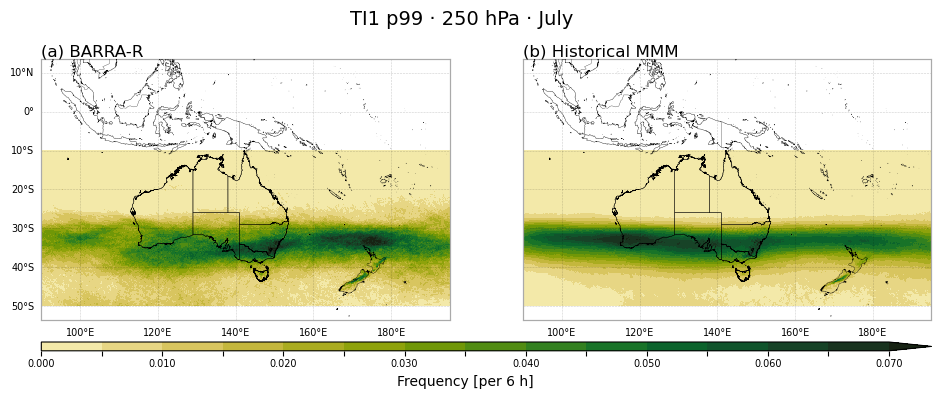

In [7]:
#TEST: plot one time selection at a time:

#importlib.reload(auscat_plots)


fig, axs = auscat_plots.plot_eval_vs_historical(
    turbulence_index=turbulence_index,
    P=250,
    time_selection="July",
    ds=ds_spatial,
    save_fig=False,
    outfile=None
)


## Plotting all time periods together:

(<Figure size 1000x400 with 3 Axes>,
 array([[<GeoAxes: title={'left': 'BARRA-R: annual'}>,
         <GeoAxes: title={'left': 'Historical MMM: annual'}>]],
       dtype=object))

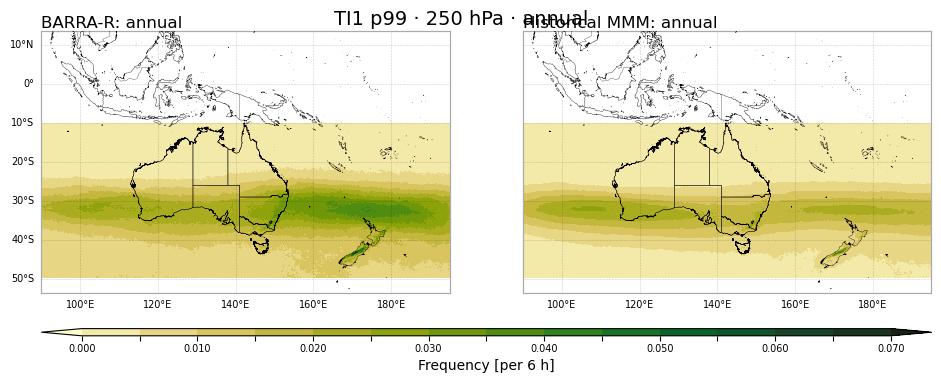

In [ ]:
# Annual

#importlib.reload(auscat_plots)

time_selection = 'annual'
box = "extended_lats"

outfile = (f"{path_stem}/"
           f"evalvshist_{turbulence_index}_{P}hPa_{box}_{time_selection}.png")

auscat_plots.plot_eval_vs_mmmhist(filelist = filelist,
                                  turbulence_index = turbulence_index, 
                                  P = 250, 
                                  time_selection = time_selection, 
                                  ds=ds_spatial,
                                  save_fig=False,
                                  outfile=outfile)

Saved to: /scratch/v46/ls7238/CAT_turbulence/Ri/250hPa/evalvshist_Ri_250hPa_extended_lats_coolwarm.png


(<Figure size 1000x800 with 5 Axes>,
 array([[<GeoAxes: title={'left': 'BARRA-R: MJJASO'}>,
         <GeoAxes: title={'left': 'Historical MMM: MJJASO'}>],
        [<GeoAxes: title={'left': 'BARRA-R: NDJFMA'}>,
         <GeoAxes: title={'left': 'Historical MMM: NDJFMA'}>]],
       dtype=object))

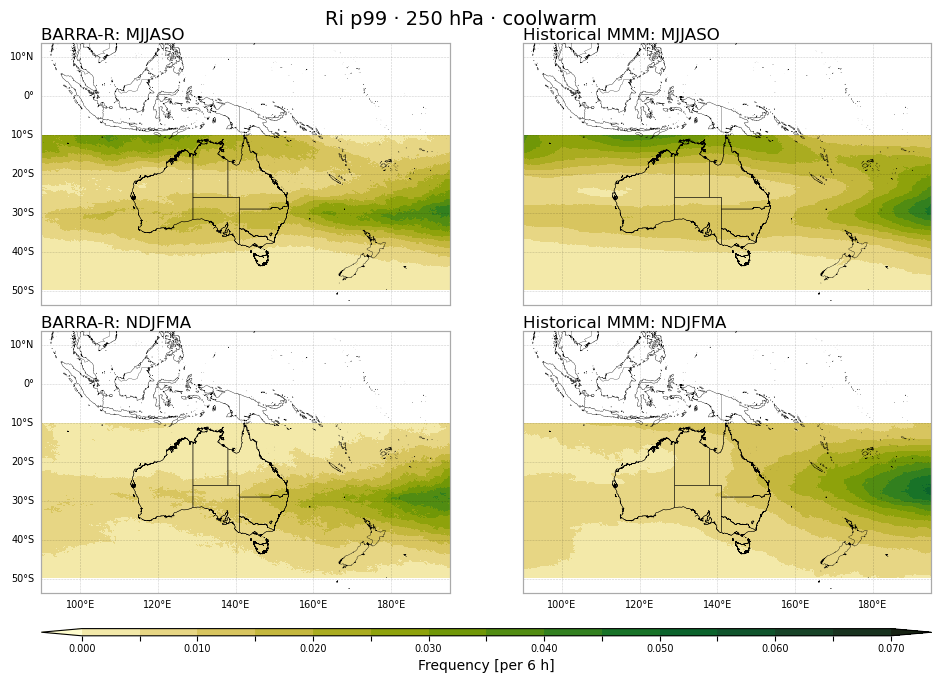

In [10]:
# Cool/warm seasons — 2x2

#importlib.reload(auscat_plots)

time_selection = 'coolwarm'

outfile = (f"/scratch/v46/ls7238/CAT_turbulence/{turbulence_index}/{P}hPa/"
           f"evalvshist_{turbulence_index}_{P}hPa_{box}_{time_selection}.png")

auscat_plots.plot_eval_vs_mmmhist(turbulence_index = turbulence_index, 
                                  P = 250, 
                                  time_selection = time_selection, 
                                  ds=ds_spatial,
                                  save_fig=True,
                                  outfile=outfile)

Saved to: /scratch/v46/ls7238/CAT_turbulence/Ri/250hPa/evalvshist_Ri_250hPa_extended_lats_seasonal.png


(<Figure size 1000x1600 with 9 Axes>,
 array([[<GeoAxes: title={'left': 'BARRA-R: DJF'}>,
         <GeoAxes: title={'left': 'Historical MMM: DJF'}>],
        [<GeoAxes: title={'left': 'BARRA-R: MAM'}>,
         <GeoAxes: title={'left': 'Historical MMM: MAM'}>],
        [<GeoAxes: title={'left': 'BARRA-R: JJA'}>,
         <GeoAxes: title={'left': 'Historical MMM: JJA'}>],
        [<GeoAxes: title={'left': 'BARRA-R: SON'}>,
         <GeoAxes: title={'left': 'Historical MMM: SON'}>]], dtype=object))

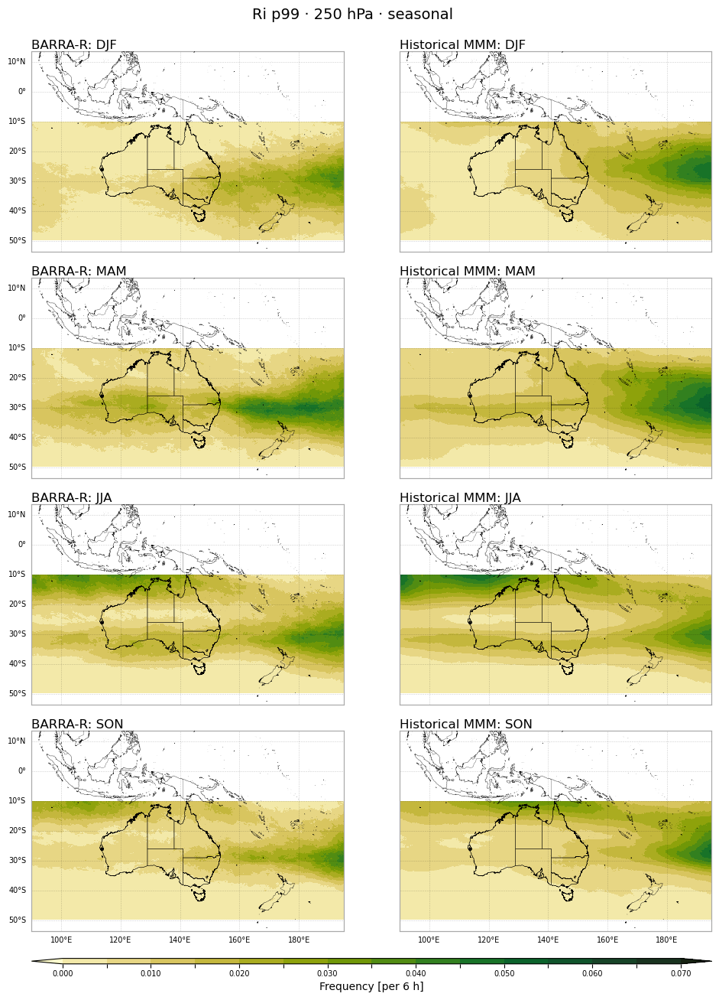

In [11]:
# Four seasons — 4x2

#importlib.reload(auscat_plots)

time_selection = 'seasonal'

outfile = (f"/scratch/v46/ls7238/CAT_turbulence/{turbulence_index}/{P}hPa/"
           f"evalvshist_{turbulence_index}_{P}hPa_{box}_{time_selection}.png")

auscat_plots.plot_eval_vs_mmmhist(turbulence_index = turbulence_index, 
                                  P = 250, 
                                  time_selection = time_selection, 
                                  ds=ds_spatial,
                                  save_fig=True,
                                  outfile=outfile)

Saved to: /scratch/v46/ls7238/CAT_turbulence/Ri/250hPa/evalvshist_Ri_250hPa_extended_lats_monthly.png


(<Figure size 1000x4800 with 25 Axes>,
 array([[<GeoAxes: title={'left': 'BARRA-R: January'}>,
         <GeoAxes: title={'left': 'Historical MMM: January'}>],
        [<GeoAxes: title={'left': 'BARRA-R: February'}>,
         <GeoAxes: title={'left': 'Historical MMM: February'}>],
        [<GeoAxes: title={'left': 'BARRA-R: March'}>,
         <GeoAxes: title={'left': 'Historical MMM: March'}>],
        [<GeoAxes: title={'left': 'BARRA-R: April'}>,
         <GeoAxes: title={'left': 'Historical MMM: April'}>],
        [<GeoAxes: title={'left': 'BARRA-R: May'}>,
         <GeoAxes: title={'left': 'Historical MMM: May'}>],
        [<GeoAxes: title={'left': 'BARRA-R: June'}>,
         <GeoAxes: title={'left': 'Historical MMM: June'}>],
        [<GeoAxes: title={'left': 'BARRA-R: July'}>,
         <GeoAxes: title={'left': 'Historical MMM: July'}>],
        [<GeoAxes: title={'left': 'BARRA-R: August'}>,
         <GeoAxes: title={'left': 'Historical MMM: August'}>],
        [<GeoAxes: title={'le

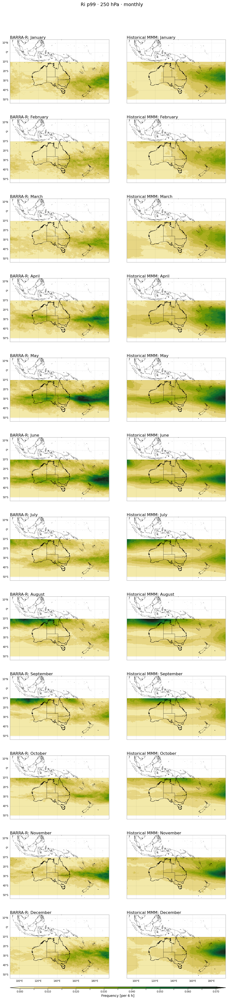

In [13]:
# All months — 12x2

#importlib.reload(auscat_plots)

time_selection = 'monthly'

outfile = (f"/scratch/v46/ls7238/CAT_turbulence/{turbulence_index}/{P}hPa/"
           f"evalvshist_{turbulence_index}_{P}hPa_{box}_{time_selection}.png")

auscat_plots.plot_eval_vs_mmmhist(turbulence_index = turbulence_index, 
                                  P = 250, 
                                  time_selection = time_selection, 
                                  ds=ds_spatial,
                                  save_fig=True,
                                  outfile=outfile)

# Plots with difference column:

(<Figure size 1500x400 with 5 Axes>,
 array([[<GeoAxes: title={'left': 'BARRA-R: annual'}>,
         <GeoAxes: title={'left': 'Historical MMM: annual'}>,
         <GeoAxes: title={'left': 'MMM - BARRA-R: annual'}>]], dtype=object))

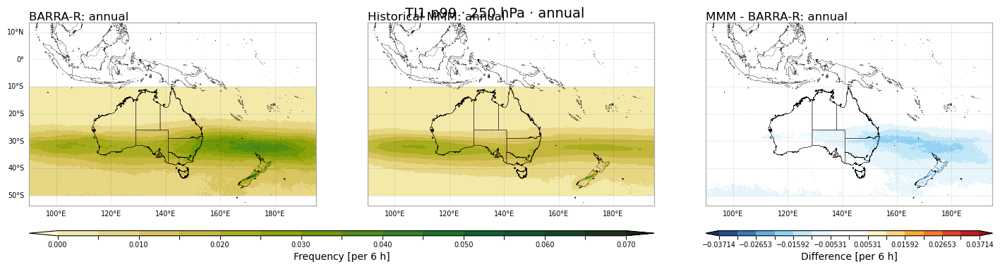

In [12]:
# Annual

#importlib.reload(auscat_plots)

#turbulence_index = 'windspeed'
time_selection = 'annual'
box = "extendedlats"

outfile = (f"{path_stem}"
           f"evalvshistwdiff_{turbulence_index}_{P}hPa_{box}_{time_selection}.png")


auscat_plots.plot_eval_vs_mmmhist_with_diff(turbulence_index,
                                            P,
                                            time_selection = 'annual',
                                            ds = ds_spatial,
                                            figsize=None,
                                            outfile=None,
                                            save_fig=False)

(<Figure size 1500x900 with 10 Axes>,
 array([[<GeoAxes: title={'left': 'BARRA-R: MJJASO'}>,
         <GeoAxes: title={'left': 'Historical MMM: MJJASO'}>,
         <GeoAxes: title={'left': 'MMM - BARRA-R: MJJASO'}>],
        [<GeoAxes: title={'left': 'BARRA-R: NDJFMA'}>,
         <GeoAxes: title={'left': 'Historical MMM: NDJFMA'}>,
         <GeoAxes: title={'left': 'MMM - BARRA-R: NDJFMA'}>]], dtype=object))

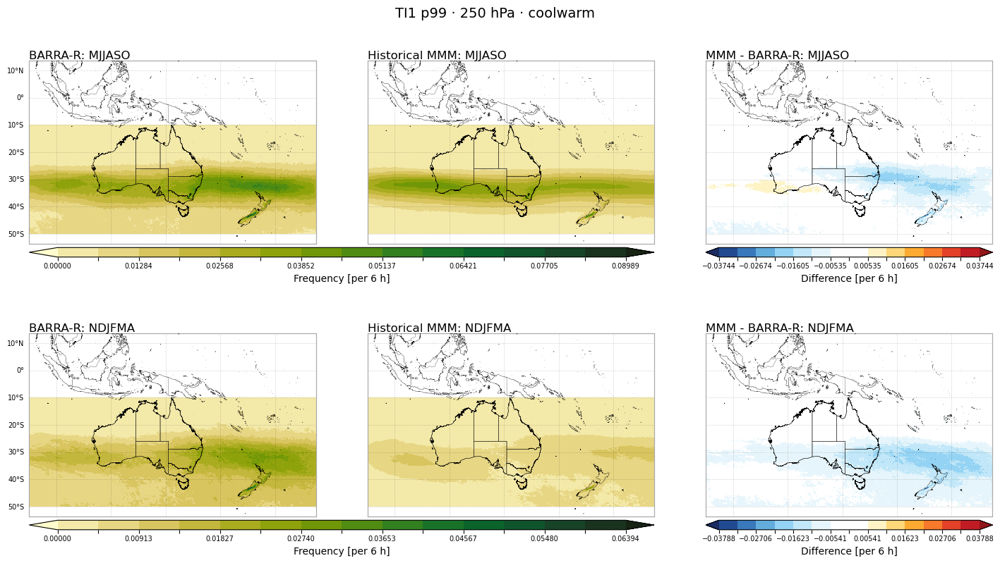

In [ ]:
# Cool/warm season:

#importlib.reload(auscat_plots)

time_selection = 'coolwarm'
box = "extendedlats"

outfile = (f"{path_stem}/"
           f"evalvshistwdiff_{turbulence_index}_{P}hPa_{box}_{time_selection}.png")


auscat_plots.plot_eval_vs_mmmhist_with_diff(turbulence_index,
                                            P,
                                            time_selection,
                                            ds = ds_spatial,
                                            share_cbar = False,
                                            outfile=outfile,
                                            save_fig=False)

(<Figure size 1500x1800 with 20 Axes>,
 array([[<GeoAxes: title={'left': 'BARRA-R: DJF'}>,
         <GeoAxes: title={'left': 'Historical MMM: DJF'}>,
         <GeoAxes: title={'left': 'MMM - BARRA-R: DJF'}>],
        [<GeoAxes: title={'left': 'BARRA-R: MAM'}>,
         <GeoAxes: title={'left': 'Historical MMM: MAM'}>,
         <GeoAxes: title={'left': 'MMM - BARRA-R: MAM'}>],
        [<GeoAxes: title={'left': 'BARRA-R: JJA'}>,
         <GeoAxes: title={'left': 'Historical MMM: JJA'}>,
         <GeoAxes: title={'left': 'MMM - BARRA-R: JJA'}>],
        [<GeoAxes: title={'left': 'BARRA-R: SON'}>,
         <GeoAxes: title={'left': 'Historical MMM: SON'}>,
         <GeoAxes: title={'left': 'MMM - BARRA-R: SON'}>]], dtype=object))

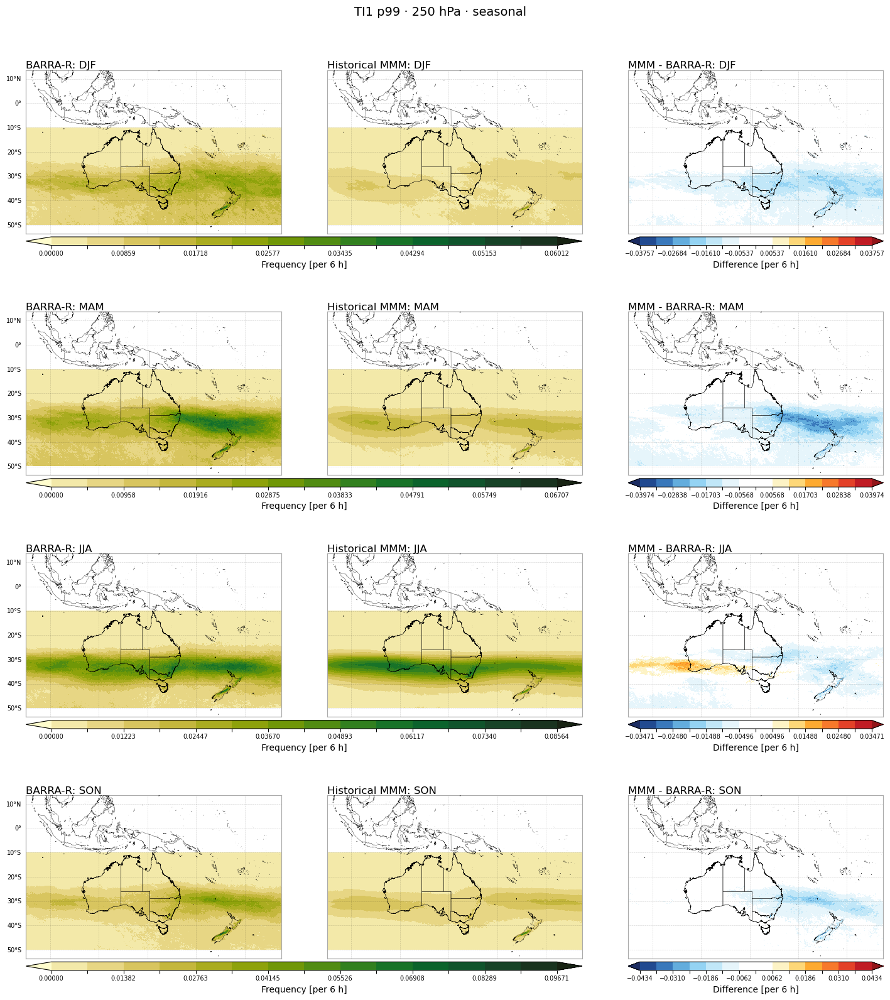

In [14]:
# Seasonal:

#importlib.reload(auscat_plots)

#turbulence_index = 'windspeed'
time_selection = 'seasonal'
box = "extendedlats"

outfile = (f"{path_stem}/"
           f"evalvshistwdiff_{turbulence_index}_{P}hPa_{box}_{time_selection}.png")


auscat_plots.plot_eval_vs_mmmhist_with_diff(turbulence_index,
                                            P,
                                            time_selection,
                                            ds = ds_spatial,
                                            share_cbar=False,
                                            figsize=None,
                                            outfile=None,
                                            save_fig=False)

(<Figure size 1500x5400 with 60 Axes>,
 array([[<GeoAxes: title={'left': 'BARRA-R: January'}>,
         <GeoAxes: title={'left': 'Historical MMM: January'}>,
         <GeoAxes: title={'left': 'MMM - BARRA-R: January'}>],
        [<GeoAxes: title={'left': 'BARRA-R: February'}>,
         <GeoAxes: title={'left': 'Historical MMM: February'}>,
         <GeoAxes: title={'left': 'MMM - BARRA-R: February'}>],
        [<GeoAxes: title={'left': 'BARRA-R: March'}>,
         <GeoAxes: title={'left': 'Historical MMM: March'}>,
         <GeoAxes: title={'left': 'MMM - BARRA-R: March'}>],
        [<GeoAxes: title={'left': 'BARRA-R: April'}>,
         <GeoAxes: title={'left': 'Historical MMM: April'}>,
         <GeoAxes: title={'left': 'MMM - BARRA-R: April'}>],
        [<GeoAxes: title={'left': 'BARRA-R: May'}>,
         <GeoAxes: title={'left': 'Historical MMM: May'}>,
         <GeoAxes: title={'left': 'MMM - BARRA-R: May'}>],
        [<GeoAxes: title={'left': 'BARRA-R: June'}>,
         <GeoAxes: 

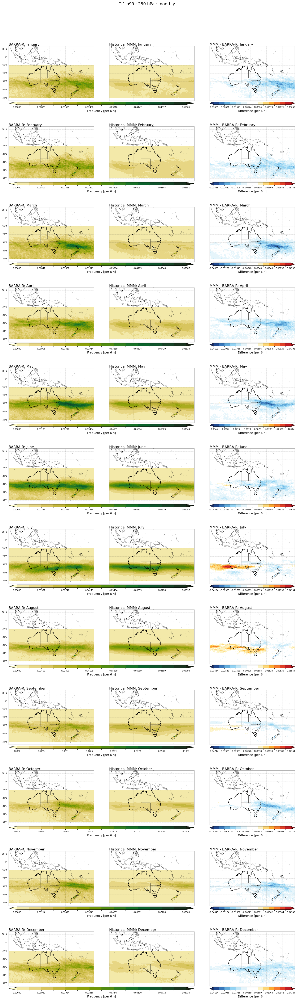

In [15]:
# monthly:

#importlib.reload(auscat_plots)

#turbulence_index = 'windspeed'
time_selection = 'monthly'
box = "extendedlat"

outfile = (f"{path_stem}/"
           f"evalvshistwdiff_{turbulence_index}_{P}hPa_{box}_{time_selection}.png")


auscat_plots.plot_eval_vs_mmmhist_with_diff(turbulence_index,
                                            P,
                                            time_selection,
                                            ds = ds_spatial,
                                            share_cbar=False,
                                            figsize=None,
                                            outfile = outfile,
                                            save_fig=False)

## Compare Barra-p99 eval with mmm-p99 mmm hist

(<Figure size 1500x900 with 10 Axes>,
 array([[<GeoAxes: title={'left': 'BARRA-p99 eval: MJJASO'}>,
         <GeoAxes: title={'left': 'MMM-p99 historical: MJJASO'}>,
         <GeoAxes: title={'left': 'MMM − BARRA-p99: MJJASO'}>],
        [<GeoAxes: title={'left': 'BARRA-p99 eval: NDJFMA'}>,
         <GeoAxes: title={'left': 'MMM-p99 historical: NDJFMA'}>,
         <GeoAxes: title={'left': 'MMM − BARRA-p99: NDJFMA'}>]],
       dtype=object))

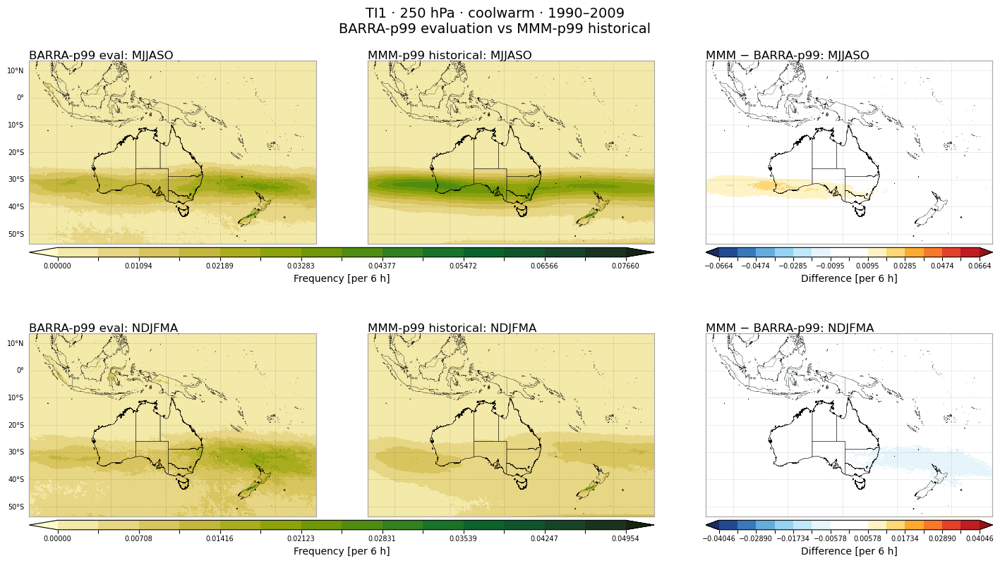

In [17]:
# Cool/warm season:

importlib.reload(auscat_plots)

time_selection = 'coolwarm'
box = "extendedlats"

outfile = (f"{path_stem}/"
           f"evalvshistwdiff_{turbulence_index}_{P}hPa_{box}_{time_selection}.png")


auscat_plots.plot_barra_vs_mmm_with_diff_v2(turbulence_index,
                                            P,
                                            time_selection,
                                            share_cbar = False,
                                            outfile=outfile,
                                            save_fig=False)

# Search for meteorological causes of differences:

## Synoptic analysis for cause of difference (MSLP)

### May (all period average):

Loading BARRA-R...
Loading BARPA MMM...
  ACCESS-CM2 done
  ACCESS-ESM1-5 done
  CESM2 done
  CMCC-ESM2 done
  EC-Earth3 done
  MPI-ESM1-2-HR done
  NorESM2-MM done
Computing arrays...
[########################################] | 100% Completed | 82.11 s
[########################################] | 100% Completed | 10m 34s
[########################################] | 100% Completed | 12m 1ss


Exception ignored in: <function CachingFileManager.__del__ at 0x7fa5ec35d8a0>
Traceback (most recent call last):
  File "/home/563/ls7238/miniconda3/envs/test/lib/python3.13/site-packages/xarray/backends/file_manager.py", line 250, in __del__
    self.close(needs_lock=False)
  File "/home/563/ls7238/miniconda3/envs/test/lib/python3.13/site-packages/xarray/backends/file_manager.py", line 234, in close
    file.close()
  File "src/netCDF4/_netCDF4.pyx", line 2669, in netCDF4._netCDF4.Dataset.close
  File "src/netCDF4/_netCDF4.pyx", line 2636, in netCDF4._netCDF4.Dataset._close
  File "src/netCDF4/_netCDF4.pyx", line 2164, in netCDF4._netCDF4._ensure_nc_success
RuntimeError: NetCDF: Not a valid ID


Cached to: /scratch/v46/ls7238/CAT_turbulence/MSLP/mslp_May_raw.pkl


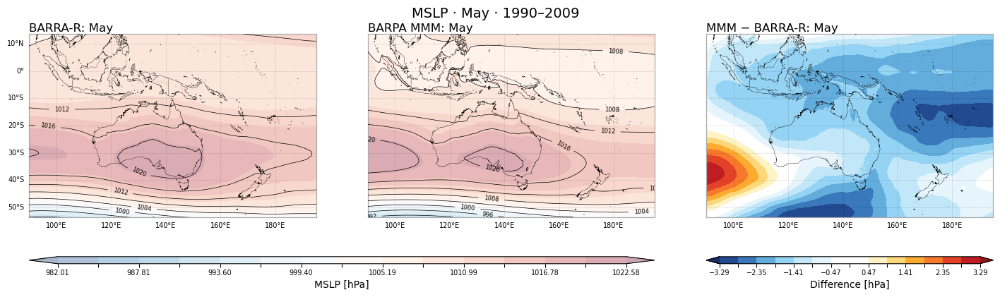

In [2]:
importlib.reload(auscat_plots)


outdir = "/scratch/v46/ls7238/CAT_turbulence/MSLP/"

mslp_plot_data = auscat_plots.prep_mslp_eval_vs_mmmhist(time_selection="May", use_cache=True,
                                              cache_dir = outdir)

fig, axs = auscat_plots.plot_mslp_eval_vs_mmmhist_diff(data = mslp_plot_data, contour_interval=4)


(<Figure size 1500x400 with 5 Axes>,
 array([<GeoAxes: title={'left': 'BARRA-R: May'}>,
        <GeoAxes: title={'left': 'BARPA MMM: May'}>,
        <GeoAxes: title={'left': 'MMM − BARRA-R: May'}>], dtype=object))

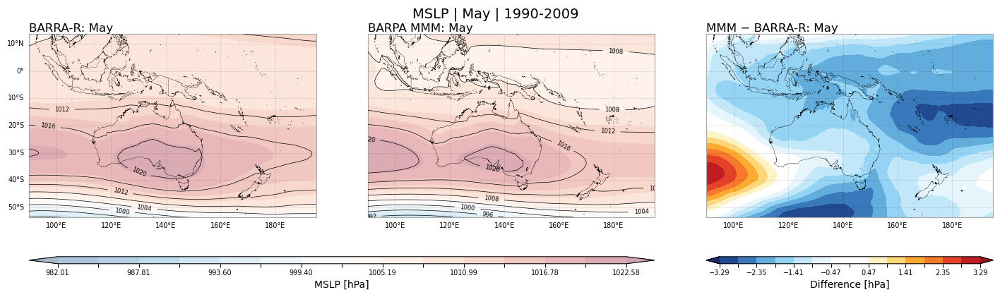

In [5]:
importlib.reload(auscat_plots)

with open("/scratch/v46/ls7238/CAT_turbulence/MSLP/mslp_May_raw.pkl", "rb") as f:
    mslp_plot_data = pickle.load(f)


auscat_plots.plot_mslp_eval_vs_mmmhist_diff(
    data = mslp_plot_data,
    figsize=None,
    ticks_abs=None,
    ticks_diff=None,
    contour_interval=4,    #
    outfile=None,
    save_fig=False,
)

### Which may is the worst?

In [3]:
# Tasman Sea bounding box 
TASMAN_BOX = dict(lon=slice(150, 190), lat=slice(-45, -10))

TI1_HIST_FILES = {
    "ACCESS-CM2":    "/scratch/v46/ls7238/CAT_turbulence/TI1/250hPa/freq-above-p99/TI1-250hPa-monthly-freq-above-p99_AUS-15_historical_ACCESS-CM2_r4i1p1f1_BOM_BARPA-R_v1-r1_6hr.nc",
    "ACCESS-ESM1-5": "/scratch/v46/ls7238/CAT_turbulence/TI1/250hPa/freq-above-p99/TI1-250hPa-monthly-freq-above-p99_AUS-15_historical_ACCESS-ESM1-5_r6i1p1f1_BOM_BARPA-R_v1-r1_6hr.nc",
    "CESM2":         "/scratch/v46/ls7238/CAT_turbulence/TI1/250hPa/freq-above-p99/TI1-250hPa-monthly-freq-above-p99_AUS-15_historical_CESM2_r11i1p1f1_BOM_BARPA-R_v1-r1_6hr.nc",
    "CMCC-ESM2":     "/scratch/v46/ls7238/CAT_turbulence/TI1/250hPa/freq-above-p99/TI1-250hPa-monthly-freq-above-p99_AUS-15_historical_CMCC-ESM2_r1i1p1f1_BOM_BARPA-R_v1-r1_6hr.nc",
    "EC-Earth3":     "/scratch/v46/ls7238/CAT_turbulence/TI1/250hPa/freq-above-p99/TI1-250hPa-monthly-freq-above-p99_AUS-15_historical_EC-Earth3_r1i1p1f1_BOM_BARPA-R_v1-r1_6hr.nc",
    "MPI-ESM1-2-HR": "/scratch/v46/ls7238/CAT_turbulence/TI1/250hPa/freq-above-p99/TI1-250hPa-monthly-freq-above-p99_AUS-15_historical_MPI-ESM1-2-HR_r1i1p1f1_BOM_BARPA-R_v1-r1_6hr.nc",
    "NorESM2-MM":    "/scratch/v46/ls7238/CAT_turbulence/TI1/250hPa/freq-above-p99/TI1-250hPa-monthly-freq-above-p99_AUS-15_historical_NorESM2-MM_r1i1p1f1_BOM_BARPA-R_v1-r1_6hr.nc",
}

TI1_EVAL_FILE = "/scratch/v46/ls7238/CAT_turbulence/TI1/250hPa/freq-above-p99/TI1-250hPa-monthly-freq-above-p99_AUS-15_evaluation_BARRA-R_r1i1p1f1_BOM_BARPA-R_v1-r1_6hr.nc"


def find_worst_months(
    months=None,             # None=all, [5]=May only, [5,6,7]=multiple
    tasman_box=None,         # override TASMAN_BOX
    n_worst=20,
    var="TI1",
):
    """
    Find months where BARPA MMM most underestimates BARRA-R TI1 250hPa
    frequency over the Tasman Sea.

    Returns a DataFrame ranked by bias (most negative = models worst),
    with columns: year, month, bias, eval_freq, hist_freq.
    """
    import pandas as pd

    box = tasman_box if tasman_box else TASMAN_BOX

    # ── Load BARRA-R ──────────────────────────────────────────────────────────
    da_eval = (
        xr.open_dataset(TI1_EVAL_FILE)[var]
        .sel(**box)
    )
    if months is not None:
        da_eval = da_eval.isel(time=da_eval.time.dt.month.isin(months))

    # ── Load MMM ──────────────────────────────────────────────────────────────
    model_das = []
    for model_name, path in TI1_HIST_FILES.items():
        da = xr.open_dataset(path)[var].sel(**box)
        if months is not None:
            da = da.isel(time=da.time.dt.month.isin(months))
        model_das.append(da)
        print(f"  Loaded {model_name}")

    da_hist = xr.concat(model_das, dim="model").mean("model")

    # ── Align time axes and compute spatial mean bias per month ───────────────
    # BARRA-R and models may not share identical time coords — align by year+month
    eval_times  = pd.DatetimeIndex(da_eval.time.values)
    hist_times  = pd.DatetimeIndex(da_hist.time.values)
    common_ym   = (
        set(zip(eval_times.year, eval_times.month)) &
        set(zip(hist_times.year, hist_times.month))
    )
    common_ym = sorted(common_ym)

    records = []
    for year, month in common_ym:
        eval_t = da_eval.isel(time=(da_eval.time.dt.year == year) &
                                    (da_eval.time.dt.month == month))
        hist_t = da_hist.isel(time=(da_hist.time.dt.year == year) &
                                    (da_hist.time.dt.month == month))

        eval_mean = float(eval_t.mean().values)
        hist_mean = float(hist_t.mean().values)
        bias      = hist_mean - eval_mean

        records.append({
            "year":      year,
            "month":     month,
            "bias":      bias,
            "eval_freq": eval_mean,
            "hist_freq": hist_mean,
        })

    df = (
        pd.DataFrame(records)
        .sort_values("bias")          # most negative = models most underestimate
        .reset_index(drop=True)
    )

    print(f"\nTop {n_worst} worst months (largest underestimate):")
    print(df.head(n_worst).to_string(index=False))

    return df


In [5]:
worst = find_worst_months(months=[5], n_worst=10, tasman_box = TASMAN_BOX, var = 'TI1')

  Loaded ACCESS-CM2
  Loaded ACCESS-ESM1-5
  Loaded CESM2
  Loaded CMCC-ESM2
  Loaded EC-Earth3
  Loaded MPI-ESM1-2-HR
  Loaded NorESM2-MM

Top 10 worst months (largest underestimate):
 year  month      bias  eval_freq  hist_freq
 1994      5 -0.015914   0.019574   0.003660
 1999      5 -0.013588   0.017302   0.003714
 2005      5 -0.013339   0.018727   0.005388
 1996      5 -0.011944   0.015488   0.003544
 2008      5 -0.011334   0.016824   0.005490
 2009      5 -0.010776   0.016962   0.006186
 2002      5 -0.010051   0.014909   0.004858
 1998      5 -0.008422   0.013223   0.004801
 1997      5 -0.008214   0.011502   0.003288
 2004      5 -0.007552   0.012619   0.005068


Loading BARRA-R...
Loading BARPA MMM...
  ACCESS-CM2 done
  ACCESS-ESM1-5 done
  CESM2 done
  CMCC-ESM2 done
  EC-Earth3 done
  MPI-ESM1-2-HR done
  NorESM2-MM done
Computing arrays...
[########################################] | 100% Completed | 4.27 sms
[########################################] | 100% Completed | 35.05 s
[########################################] | 100% Completed | 38.60 s


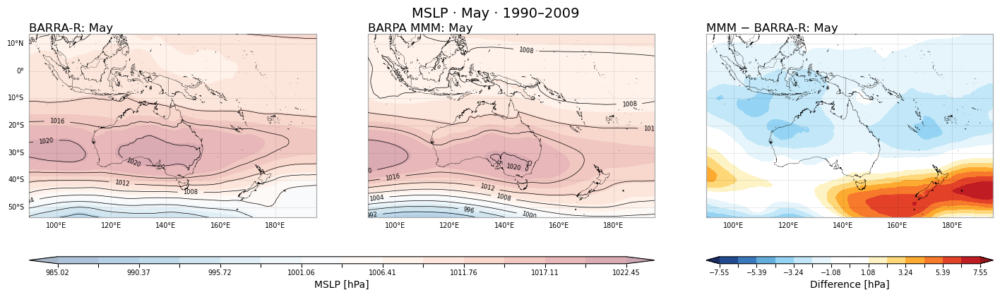

In [ ]:
# 1994:

data94 = auscat_plots.prep_mslp_eval_vs_mmmhist(
    time_selection="May",
    test_year=1994,
    use_cache=False)

fig, axs = auscat_plots.plot_mslp_eval_vs_mmmhist_diff(data94, contour_interval=4, 
                                                       single_label = True, year = "1994")


Loading BARRA-R...


Loading BARPA MMM...
  ACCESS-CM2 done
  ACCESS-ESM1-5 done
  CESM2 done
  CMCC-ESM2 done
  EC-Earth3 done
  MPI-ESM1-2-HR done
  NorESM2-MM done
Computing arrays...
[########################################] | 100% Completed | 4.47 sms
[########################################] | 100% Completed | 32.92 s
[########################################] | 100% Completed | 38.31 s


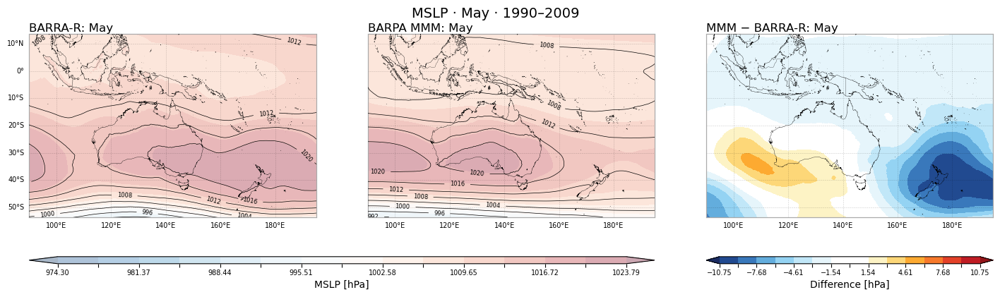

In [ ]:
# 1999:

data99 = auscat_plots.prep_mslp_eval_vs_mmmhist(
    time_selection="May",
    test_year=1999,
    use_cache=False)

fig, axs = auscat_plots.plot_mslp_eval_vs_mmmhist_diff(data99, contour_interval=4,
                                                       single_label = True, year = "1999")


Loading BARRA-R...
Loading BARPA MMM...
  ACCESS-CM2 done
  ACCESS-ESM1-5 done
  CESM2 done
  CMCC-ESM2 done
  EC-Earth3 done
  MPI-ESM1-2-HR done
  NorESM2-MM done
Computing arrays...
[########################################] | 100% Completed | 4.56 sms
[########################################] | 100% Completed | 36.09 s
[########################################] | 100% Completed | 38.36 s


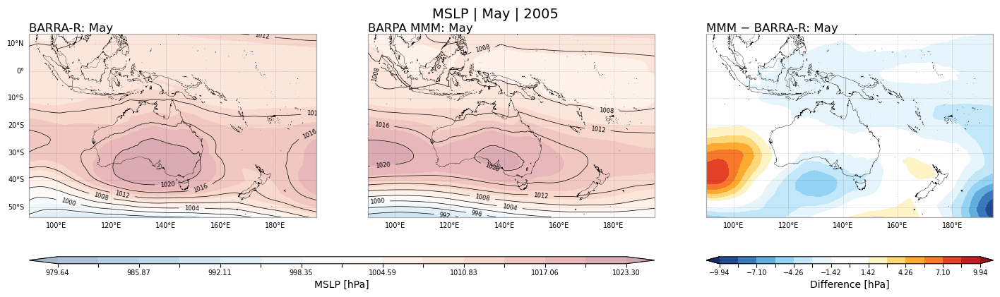

In [6]:
# 2005:

data05 = auscat_plots.prep_mslp_eval_vs_mmmhist(
    time_selection="May",
    test_year=2005,
    use_cache=False)

fig, axs = auscat_plots.plot_mslp_eval_vs_mmmhist_diff(data05, contour_interval=4,
                                                       single_label = True, year = "2005")


Loading BARRA-R...
Loading BARPA MMM...
  ACCESS-CM2 done
  ACCESS-ESM1-5 done
  CESM2 done


  CMCC-ESM2 done
  EC-Earth3 done
  MPI-ESM1-2-HR done
  NorESM2-MM done
Computing arrays...
[########################################] | 100% Completed | 4.56 sms
[########################################] | 100% Completed | 35.61 s
[########################################] | 100% Completed | 38.87 s


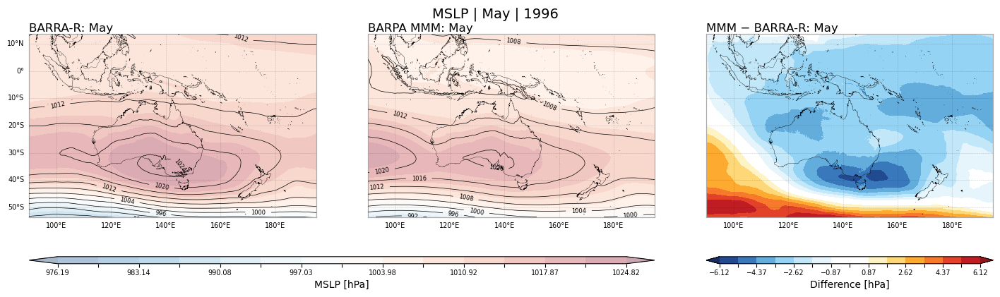

In [7]:
# 1996:
importlib.reload(auscat_plots)

data96 = auscat_plots.prep_mslp_eval_vs_mmmhist(
    time_selection="May",
    test_year=1996,
    use_cache=False)

fig, axs = auscat_plots.plot_mslp_eval_vs_mmmhist_diff(data96, contour_interval=4,
                                                       single_label = True, year = "1996")

### Is there a model doing the worst?

Loading BARRA-R...
[########################################] | 100% Completed | 60.06 s
[########################################] | 100% Completed | 79.49 s
  Loading ACCESS-CM2...
[########################################] | 100% Completed | 70.49 s
    done
  Loading ACCESS-ESM1-5...
[########################################] | 100% Completed | 102.71 s
    done
  Loading CESM2...
[########################################] | 100% Completed | 68.43 s
    done
  Loading CMCC-ESM2...
[########################################] | 100% Completed | 102.56 s
    done
  Loading EC-Earth3...
[########################################] | 100% Completed | 69.54 s
    done
  Loading MPI-ESM1-2-HR...
[########################################] | 100% Completed | 103.93 s
    done
  Loading NorESM2-MM...
[########################################] | 100% Completed | 102.73 s
    done
Cached to: /scratch/v46/ls7238/CAT_turbulence/MSLP/mslp_permodel_May_raw.pkl


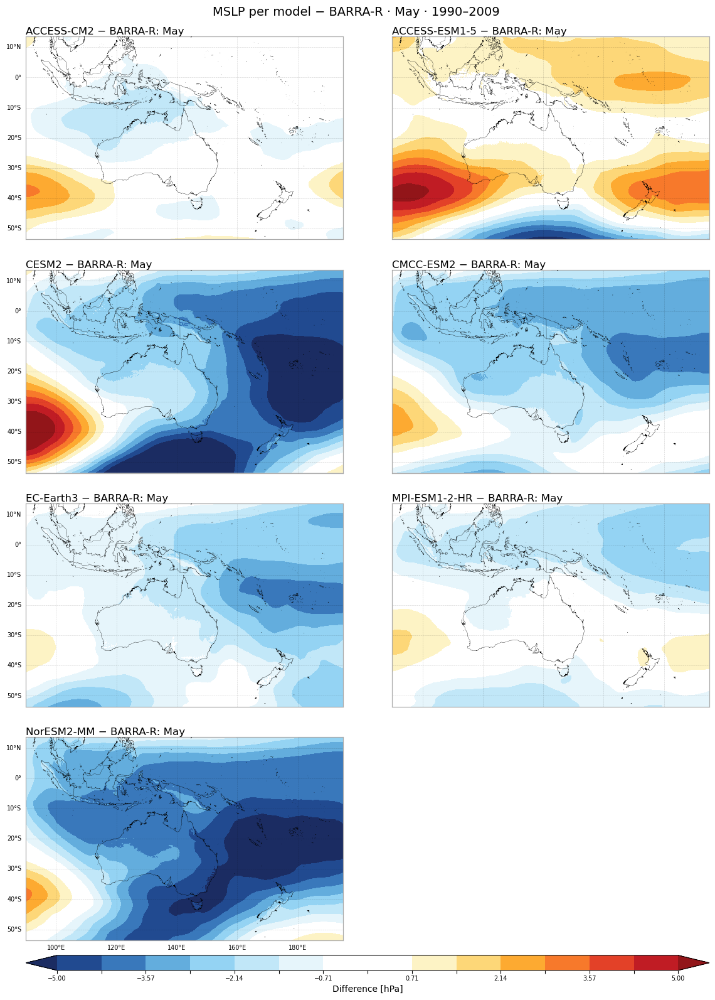

In [ ]:
importlib.reload(auscat_plots)

per_model_data = auscat_plots.prep_mslp_per_model(
    time_selection="May", use_cache=True,
    cache_dir="/scratch/v46/ls7238/CAT_turbulence/MSLP/",
)
fig, axs = auscat_plots.plot_mslp_per_model_diff(per_model_data, ticks_diff=5.0)

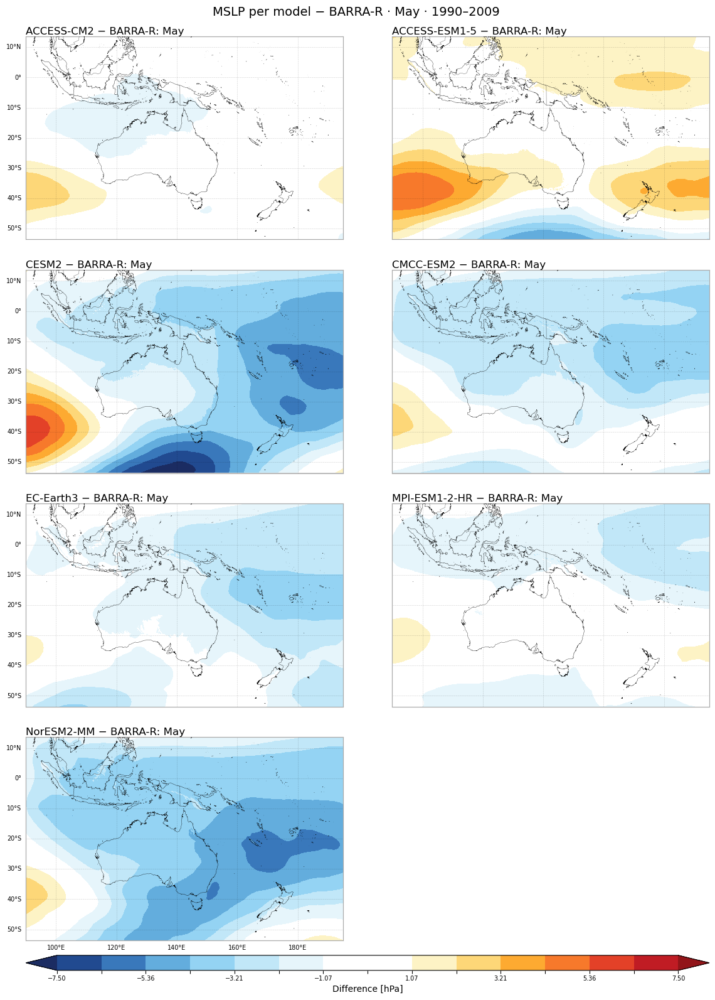

In [7]:
fig, axs = auscat_plots.plot_mslp_per_model_diff(per_model_data, ticks_diff=7.5)

## 500hPa Geopotential Height Differences

In [ ]:
importlib.reload(auscat_plots)

# MMM version
z500_mmm_data = auscat_plots.prep_z500_eval_vs_mmmhist(
    time_selection="May",
    use_cache=True,
    cache_dir="/scratch/v46/ls7238/CAT_turbulence/GeoP_500hPa"
)

# Per-model version
z500_permodel_data = auscat_plots.prep_z500_per_model(
    time_selection="May",
    use_cache=True,
    cache_dir="/scratch/v46/ls7238/CAT_turbulence/GeoP_500hPa"
)


Loading BARRA-R Z500...
[########################################] | 100% Completed | 28m 16s
Loading BARPA MMM Z500...
  ACCESS-CM2 done
  ACCESS-ESM1-5 done
  CESM2 done
  CMCC-ESM2 done
  EC-Earth3 done
  MPI-ESM1-2-HR done
  NorESM2-MM done
Cached to: /scratch/v46/ls7238/CAT_turbulence/GeoP_500hPa/z500_mmm_May.pkl
Loading BARRA-R Z500...
[######################                  ] | 56% Completed | 532.46 s

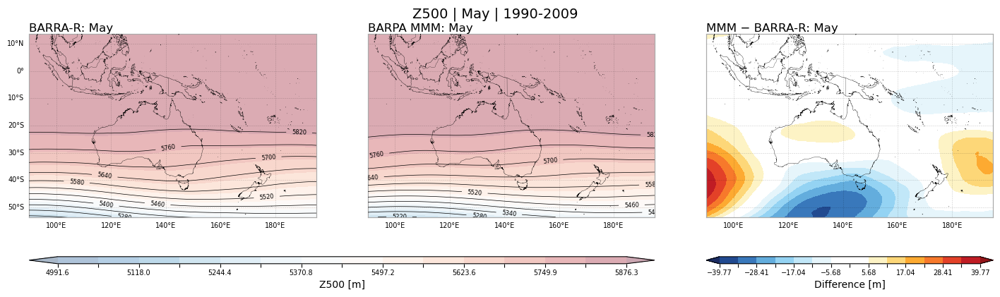

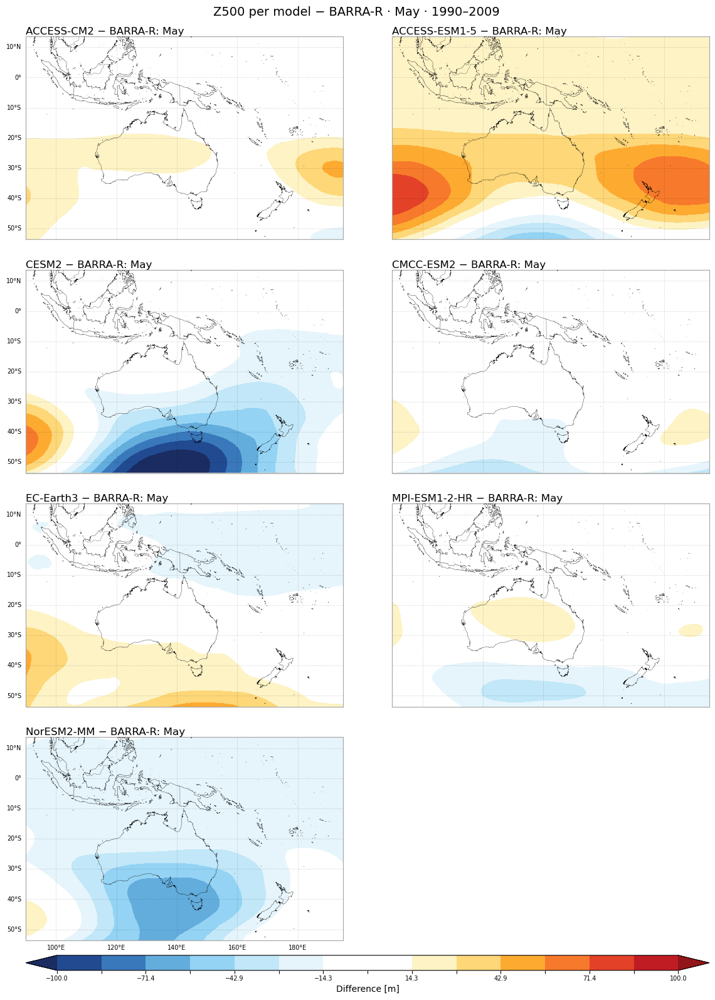

In [4]:
importlib.reload(auscat_plots)

with open("/scratch/v46/ls7238/CAT_turbulence/GeoP_500hPa/z500_mmm_May.pkl", "rb") as f:
    z500_mmm_data = pickle.load(f)

with open("/scratch/v46/ls7238/CAT_turbulence/GeoP_500hPa/z500_permodel_May.pkl", "rb") as f:
    z500_permodel_data = pickle.load(f)

# MMM plot
fig, axs = auscat_plots.plot_mslp_eval_vs_mmmhist_diff(
    z500_mmm_data,
    contour_interval=60,
    save_fig=False,
    outfile="/scratch/v46/ls7238/CAT_turbulence/MSLP/Z500_May_MMM.png",
)

# Per-model plot
fig, axs = auscat_plots.plot_mslp_per_model_diff(
    z500_permodel_data,
    ticks_diff=100,
    save_fig=False,
    outfile="/scratch/v46/ls7238/CAT_turbulence/MSLP/Z500_May_permodel.png",
)


## Surface temperature

Loading from cache: /scratch/v46/ls7238/CAT_turbulence/Temp/temp_mmm_May.pkl
Loading from cache: /scratch/v46/ls7238/CAT_turbulence/Temp/temp_permodel_May.pkl
Loading BARRA-R surface temperature...
[########################################] | 100% Completed | 217.76 ms
[########################################] | 100% Completed | 71.30 s
Loading BARPA MMM surface temperature...
  ACCESS-CM2 done
  ACCESS-ESM1-5 done
  CESM2 done
  CMCC-ESM2 done
  EC-Earth3 done
  MPI-ESM1-2-HR done
  NorESM2-MM done
Cached to: /scratch/v46/ls7238/CAT_turbulence/Temp/sst_mmm_May.pkl
Loading BARRA-R surface temperature...
[########################################] | 100% Completed | 222.17 ms
[########################################] | 100% Completed | 67.09 s
  Loading ACCESS-CM2...
[########################################] | 100% Completed | 102.78 s
    done
  Loading ACCESS-ESM1-5...
[########################################] | 100% Completed | 100.14 s
    done
  Loading CESM2...
[###############

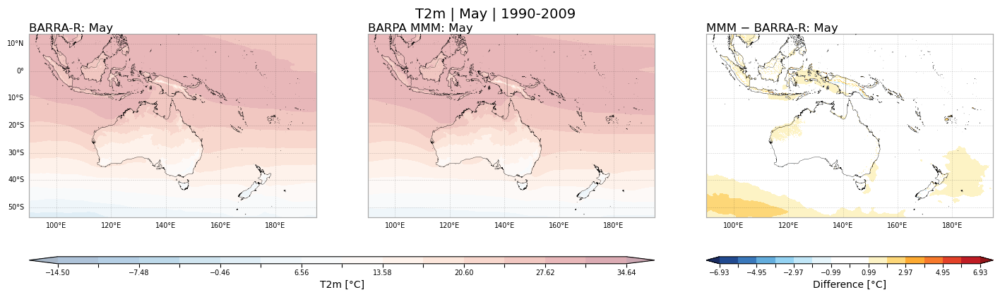

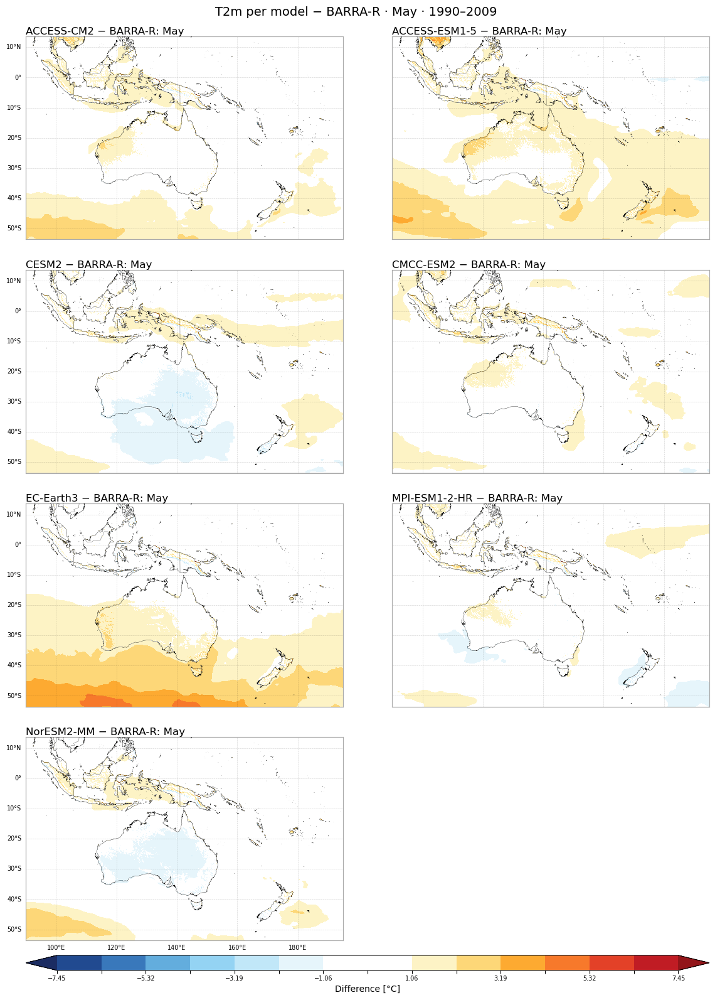

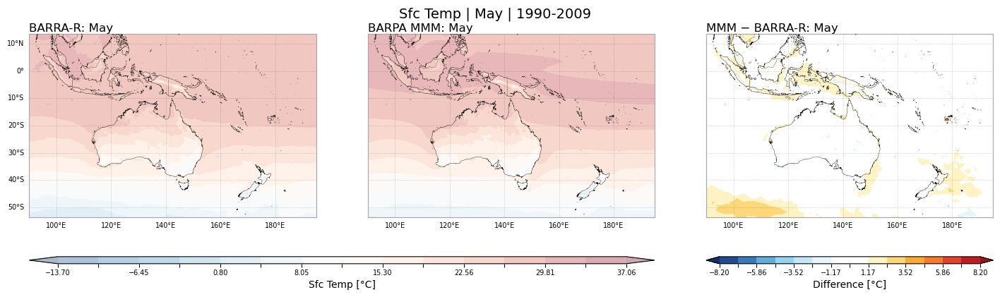

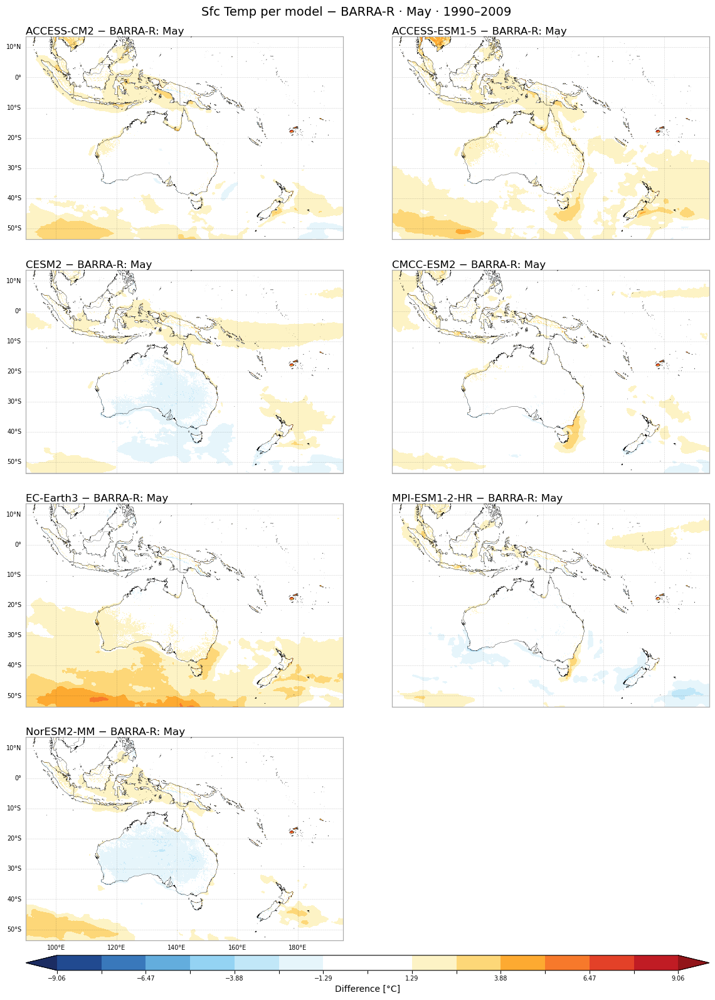

In [10]:
importlib.reload(auscat_plots)

outdir = "/scratch/v46/ls7238/CAT_turbulence/Temp"

# ── 2m air temperature (T2m) ─────────────────────────────────────────────────
t2m_mmm_data = auscat_plots.prep_temp_eval_vs_mmmhist(
    time_selection="May", use_cache=True, cache_dir=outdir,
)
t2m_permodel_data = auscat_plots.prep_temp_per_model(
    time_selection="May", use_cache=True, cache_dir=outdir,
)

# ── Surface temperature (SST) ────────────────────────────────────────────
sst_mmm_data = auscat_plots.prep_sst_eval_vs_mmmhist(
    time_selection="May", use_cache=True, cache_dir=outdir,
)
sst_permodel_data = auscat_plots.prep_sst_per_model(
    time_selection="May", use_cache=True, cache_dir=outdir,
)

# ── Plots ─────────────────────────────────────────────────────────────────────
fig, axs = auscat_plots.plot_mslp_eval_vs_mmmhist_diff(
    t2m_mmm_data, show_contours=False, save_fig=True,
    outfile=f"{outdir}T2m_May_MMM.png",
)
fig, axs = auscat_plots.plot_mslp_per_model_diff(
    t2m_permodel_data, save_fig=True,
    outfile=f"{outdir}T2m_May_permodel.png",
)
fig, axs = auscat_plots.plot_mslp_eval_vs_mmmhist_diff(
    sst_mmm_data, show_contours=False, save_fig=True,
    outfile=f"{outdir}SfcTemp_May_MMM.png",
)
fig, axs = auscat_plots.plot_mslp_per_model_diff(
    sst_permodel_data, save_fig=True,
    outfile=f"{outdir}SfcTemp_May_permodel.png",
)
